<a href="https://colab.research.google.com/github/Siddharth1401/Image-Enhancement-Cancer-Detection-/blob/main/BreastCancerAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Accuracy: 0.956140350877193
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94        43
           1       0.97      0.96      0.96        71

    accuracy                           0.96       114
   macro avg       0.95      0.96      0.95       114
weighted avg       0.96      0.96      0.96       114



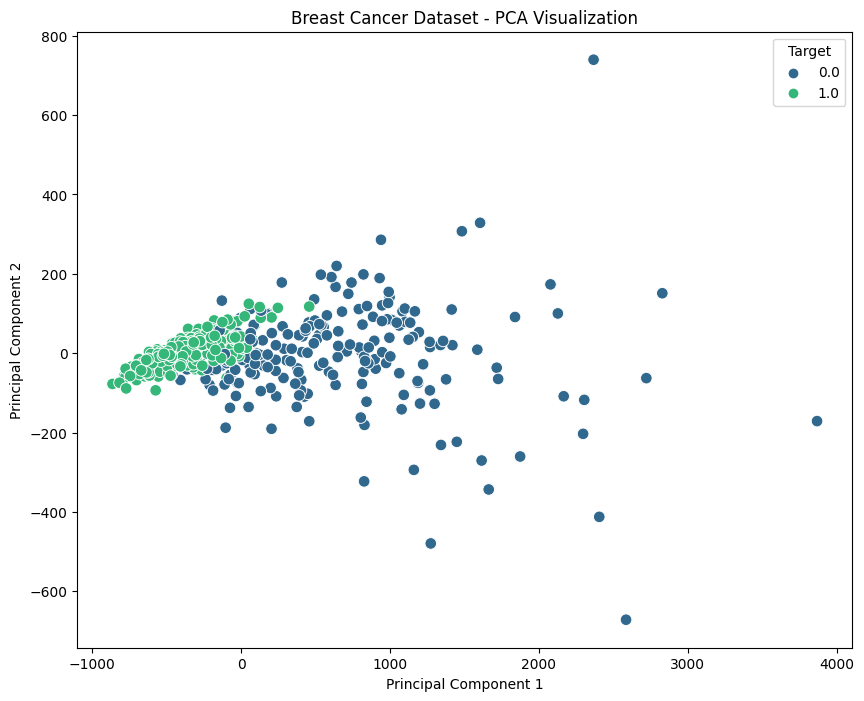

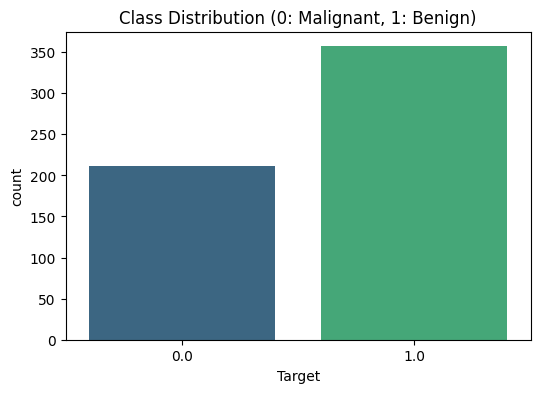

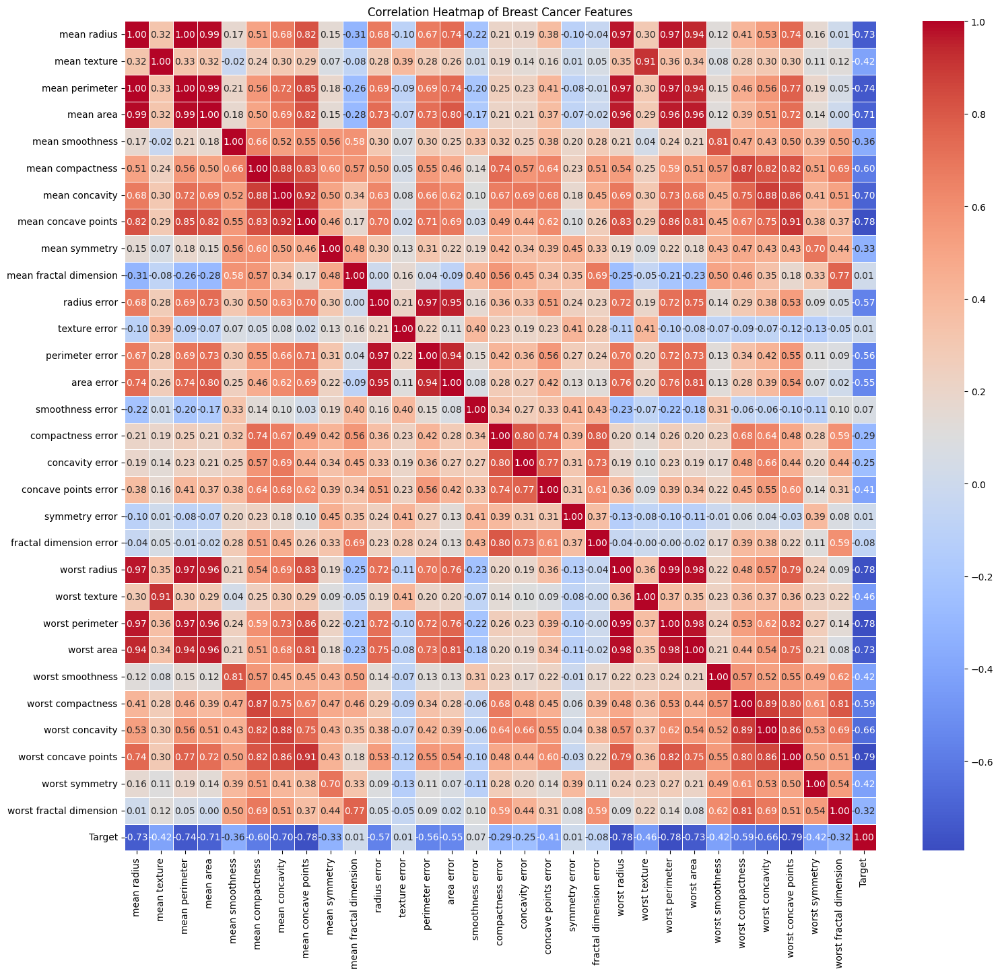

In [ ]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load breast cancer dataset
data = load_breast_cancer()
X, y = data.data, data.target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (important for SVM)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train an SVM classifier
classifier = SVC(kernel='linear', C=1.0, random_state=42)
classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = classifier.predict(X_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print('Classification Report:')
print(report)

# Apply PCA for dimensionality reduction (for visualization purposes)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a DataFrame for visualization using seaborn
df = pd.DataFrame(data=np.c_[X_pca, y], columns=['Principal Component 1', 'Principal Component 2', 'Target'])

# Visualize the data using pairplot
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Principal Component 1', y='Principal Component 2', hue='Target', data=df, palette='viridis', s=70)
plt.title('Breast Cancer Dataset - PCA Visualization')
plt.show()

# Create a DataFrame for visualization using seaborn
feature_names = data.feature_names
df_cancer = pd.DataFrame(data=np.c_[X, y], columns=[*feature_names, 'Target'])

# Select features for pairplot
selected_features = [
    'mean radius', 'mean texture', 'mean perimeter', 'mean area',
    'mean smoothness', 'mean compactness', 'mean concavity',
    'mean concave points', 'mean symmetry', 'mean fractal dimension',
    'radius error', 'texture error', 'perimeter error', 'area error',
    'smoothness error', 'compactness error', 'concavity error',
    'concave points error', 'symmetry error', 'fractal dimension error',
    'worst radius', 'worst texture', 'worst perimeter', 'worst area',
    'worst smoothness', 'worst compactness', 'worst concavity',
    'worst concave points', 'worst symmetry', 'worst fractal dimension'
]

# Visualize the data using pairplot
sns.pairplot(df_cancer, vars=selected_features, hue='Target', palette='viridis', markers=['o', 's'])
plt.show()

# Create a DataFrame for visualization using seaborn
df_cancer = pd.DataFrame(data=np.c_[X, y], columns=[*feature_names, 'Target'])

# Visualize the class distribution using countplot
plt.figure(figsize=(6, 4))
sns.countplot(x='Target', data=df_cancer, palette='viridis')
plt.title('Class Distribution (0: Malignant, 1: Benign)')
plt.show()

# Create a DataFrame for visualization using seaborn
df_cancer = pd.DataFrame(data=np.c_[X, y], columns=[*feature_names, 'Target'])

# Compute the correlation matrix
corr_matrix = df_cancer.corr()

# Set up the matplotlib figure
plt.figure(figsize=(18, 16))

# Create a heatmap using seaborn
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

plt.title('Correlation Heatmap of Breast Cancer Features')
plt.show()
